## Постановка задачи

* Подготовьте прототип модели машинного обучения для N. Компания разрабатывает решения для эффективной работы промышленных предприятий.
* Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды. В вашем распоряжении данные с параметрами добычи и очистки.
* Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.


[id]: C:/Users/simmu/Documents/Yandex.Praktikum/PROJECTS/module_2_projects/viruchka_1576238830.jpg"

## Описание данных
**Технологический процесс**
* Click here!

<!--- * Rougher feed — исходное сырье
* Rougher additions (или reagent additions) — флотационные реагенты: Xanthate, Sulphate, Depressant
* Xanthate **— ксантогенат (промотер, или активатор флотации);
* Sulphate — сульфат (на данном производстве сульфид натрия);
* Depressant — депрессант (силикат натрия).
* Rougher process (англ. «грубый процесс») — флотация
* Rougher tails — отвальные хвосты
* Float banks — флотационная установка
* Cleaner process — очистка
* Rougher Au — черновой концентрат золота
* Final Au — финальный концентрат золота -->

**Параметры этапов**
* Click here!

<!---
* air amount — объём воздуха
* fluid levels — уровень жидкости
* feed size — размер гранул сырья
* feed rate — скорость подачи
-->

## Расчёт эффективности
Вам нужно смоделировать процесс восстановления золота из золотосодержащей руды.
* Эффективность обогащения рассчитывается по формуле:

<img src="https://pictures.s3.yandex.net/resources/Recovery_1576238822.jpg" width="500" height="500" />

где:
* C — доля золота в концентрате после флотации/очистки;
* F — доля золота в сырье/концентрате до флотации/очистки;
* T — доля золота в отвальных хвостах после флотации/очистки.

## Метрика качества
Для решения задачи введём новую метрику качества — **sMAPE (англ. Symmetric Mean Absolute Percentage Error, «симметричное среднее абсолютное процентное отклонение»).**
* Она похожа на **MAE**, но выражается не в абсолютных величинах, а в относительных.

Нужно спрогнозировать сразу две величины:
* эффективность обогащения чернового концентрата **rougher.output.recovery;**
* эффективность обогащения финального концентрата **final.output.recovery.**

**Итоговая метрика** складывается из двух величин:
<img src="https://pictures.s3.yandex.net/resources/_smape_1576238814.jpg" width="500" height="500" />

**Содержание:**
* <a href='#1'>Общая информация</a>
* <a href='#2'>1.2 Проверим, насколько правильно рассчитана эффективность обогащения</a>
* <a href='#3'>1.3 Проанализируем признаки, недоступные в тестовой выборке</a>
* <a href='#4'>1.4 Предобработка данных</a>

Анализ данных

* <a href='#5'>2.1 Посмотрим, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах очистки</a>
* <a href='#6'>2.2 Сравним распределения размеров гранул сырья на обучающей и тестовой выборках</a>
* <a href='#7'>2.3 Подсчитаем суммарную концентрацию всех веществ на разных стадиях</a>

Модель

* <a href='#8'>3.1 Напишем функцию для вычисления итоговой sMAPE</a>
* <a href='#9'>3.2.2 Выделим целевые признаки. Проведем стандартизацию данных</a>
* <a href='#10'>3.2.3 Обучим разные модели</a>
* <a href='#11'>3.2.4 Проверка на тестовой выборке</a>
* <a href='#12'>Вывод</a>




### **Если возникнет проблема с построение графиков plotly или seaborn, то в отдельной строке:**
pip install plotly --upgrade
pip install seaborn --upgrade

<a id='1'></a>

<a id='1'></a>

## 1.1 Общая информация

In [1]:
# импортируем необходимые библиотеки
import pandas as pd
import numpy as np
from numpy.random import RandomState
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import fbeta_score, make_scorer
from sklearn.preprocessing import StandardScaler 
import plotly.express as px
from plotly.graph_objs import *
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff
from sklearn.dummy import DummyRegressor
#from sklearn.impute import KNNImputer



from sklearn.pipeline import make_pipeline

import warnings
warnings.filterwarnings("ignore")

In [2]:
pd.set_option("display.max_columns", None)

In [3]:
def data_info(path):
    df = pd.read_csv(path)
    print(df.info())
    display(df.head(10))
    return df

gold_rec_train = data_info('C:/Users/simmu/Documents/CSV files/gold_recovery_train.csv')
gold_rec_full = data_info('C:/Users/simmu/Documents/CSV files/gold_recovery_full.csv')
gold_rec_test = data_info('C:/Users/simmu/Documents/CSV files/gold_recovery_test.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                16860 non-null  object 
 1   final.output.concentrate_ag                         16788 non-null  float64
 2   final.output.concentrate_pb                         16788 non-null  float64
 3   final.output.concentrate_sol                        16490 non-null  float64
 4   final.output.concentrate_au                         16789 non-null  float64
 5   final.output.recovery                               15339 non-null  float64
 6   final.output.tail_ag                                16794 non-null  float64
 7   final.output.tail_pb                                16677 non-null  float64
 8   final.output.tail_sol                               16715 non-null  float64


,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,10.128295,7.25,0.988759,8.547551,10.389648,19.529297,34.174427,14.936526,2.534912,7.476074,2.106679,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,41885.707031,3481.779053,3520.337158,2.838687,6.100378,2.284912,523.546326,55.486599,36.808594,6.486150,11.986616,6.007990,11.836743,6.005818,11.500771,7.101074,28.029297,19.793808,87.107763,5.008018,0.508728,19.154297,1.170244,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636,14.500184,4.694824,8.764648,2.606185,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,10.296251,7.25,1.002663,8.558743,10.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22716 entries, 0 to 22715
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                22716 non-null  object 
 1   final.output.concentrate_ag                         22627 non-null  float64
 2   final.output.concentrate_pb                         22629 non-null  float64
 3   final.output.concentrate_sol                        22331 non-null  float64
 4   final.output.concentrate_au                         22630 non-null  float64
 5   final.output.recovery                               20753 non-null  float64
 6   final.output.tail_ag                                22633 non-null  float64
 7   final.output.tail_pb                                22516 non-null  float64
 8   final.output.tail_sol                               22445 non-null  float64


,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,10.128295,7.25,0.988759,8.547551,10.389648,19.529297,34.174427,14.936526,2.534912,7.476074,2.106679,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,41885.707031,3481.779053,3520.337158,2.838687,6.100378,2.284912,523.546326,55.486599,36.808594,6.486150,11.986616,6.007990,11.836743,6.005818,11.500771,7.101074,28.029297,19.793808,87.107763,5.008018,0.508728,19.154297,1.170244,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636,14.500184,4.694824,8.764648,2.606185,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,10.296251,7.25,1.002663,8.558743,10.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5856 entries, 0 to 5855
Data columns (total 53 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   date                                        5856 non-null   object 
 1   primary_cleaner.input.sulfate               5554 non-null   float64
 2   primary_cleaner.input.depressant            5572 non-null   float64
 3   primary_cleaner.input.feed_size             5856 non-null   float64
 4   primary_cleaner.input.xanthate              5690 non-null   float64
 5   primary_cleaner.state.floatbank8_a_air      5840 non-null   float64
 6   primary_cleaner.state.floatbank8_a_level    5840 non-null   float64
 7   primary_cleaner.state.floatbank8_b_air      5840 non-null   float64
 8   primary_cleaner.state.floatbank8_b_level    5840 non-null   float64
 9   primary_cleaner.state.floatbank8_c_air      5840 non-null   float64
 10  primary_clea

,date,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,-500.704369,1399.001695,-499.485144,13.128569,5.636710,489.793655,62.710452,42.022440,12.084103,16.922877,6.153479,16.867518,6.150709,1001.849317,-350.301265,1249.738612,-399.107531,1249.750520,-399.396730,1198.287855,-399.488594,999.472250,-399.530962,949.566189,-398.180807,24.938200,-500.490963,14.947607,-500.013837,20.018166,-450.395995,13.987058,-449.831513,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
1,2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,-499.240168,1399.508091,-500.416324,13.036280,5.526065,490.104534,61.961163,41.187903,11.918977,17.002532,5.999043,16.996063,6.002315,998.690785,-350.425704,1248.395457,-399.946025,1249.514451,-399.630810,1200.506459,-399.942434,1000.002114,-399.491528,950.200009,-405.787514,24.923466,-499.813963,14.930873,-500.764452,19.988503,-450.114024,14.092981,-450.059163,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2,2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,-502.151509,1399.497088,-499.715479,13.138412,5.426561,489.617969,66.903807,42.546294,12.091332,16.992520,5.850632,16.982096,5.853594,998.516720,-349.783538,1247.440748,-400.264330,1248.207204,-401.074405,1199.770026,-400.790582,999.925519,-399.236999,950.320481,-400.864340,24.908732,-500.304035,14.996511,-500.993821,20.039689,-450.263164,14.077881,-449.660997,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
3,2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,-498.355873,1401.065165,-501.038738,12.400507,5.114758,476.618130,59.865919,41.060195,12.181597,16.532144,5.801935,16.515277,5.803657,1000.276604,-350.172597,1251.322675,-398.655289,1250.493702,-399.746728,1199.398691,-397.50

In [4]:
def missing(df):
    percent_missing = (100*df.isnull().sum() / len(df)).round(1)
    percent_missing = percent_missing.sort_values(ascending=False)
    print('Процент пропущенных значений: \n' , percent_missing.head(15))

In [5]:
missing(gold_rec_train)

Процент пропущенных значений: 
 rougher.output.recovery                   15.3
rougher.output.tail_ag                    13.3
rougher.output.tail_au                    13.3
rougher.output.tail_sol                   13.3
secondary_cleaner.output.tail_sol         11.8
rougher.input.floatbank11_xanthate        11.3
final.output.recovery                      9.0
primary_cleaner.input.sulfate              7.8
primary_cleaner.input.depressant           7.5
rougher.calculation.au_pb_ratio            7.4
rougher.input.floatbank10_sulfate          6.2
primary_cleaner.input.xanthate             5.8
primary_cleaner.output.concentrate_sol     3.8
rougher.input.floatbank11_sulfate          3.7
rougher.state.floatbank10_e_air            3.6
dtype: float64


In [6]:
missing(gold_rec_test)

Процент пропущенных значений: 
 rougher.input.floatbank11_xanthate          6.0
primary_cleaner.input.sulfate               5.2
primary_cleaner.input.depressant            4.8
rougher.input.floatbank10_sulfate           4.4
primary_cleaner.input.xanthate              2.8
rougher.input.floatbank10_xanthate          2.1
rougher.input.feed_sol                      1.1
rougher.input.floatbank11_sulfate           0.9
rougher.input.feed_rate                     0.7
secondary_cleaner.state.floatbank3_a_air    0.6
secondary_cleaner.state.floatbank2_b_air    0.4
rougher.input.feed_size                     0.4
rougher.state.floatbank10_a_air             0.3
rougher.input.feed_au                       0.3
rougher.input.feed_pb                       0.3
dtype: float64


In [7]:
missing(gold_rec_full)

Процент пропущенных значений: 
 rougher.output.recovery                   13.7
rougher.output.tail_ag                    12.0
rougher.output.tail_sol                   12.0
rougher.output.tail_au                    12.0
rougher.input.floatbank11_xanthate         9.9
secondary_cleaner.output.tail_sol          9.8
final.output.recovery                      8.6
rougher.calculation.au_pb_ratio            7.2
primary_cleaner.input.sulfate              7.1
primary_cleaner.input.depressant           6.8
rougher.input.floatbank10_sulfate          5.7
primary_cleaner.input.xanthate             5.1
primary_cleaner.output.concentrate_sol     3.5
rougher.input.floatbank11_sulfate          3.0
rougher.state.floatbank10_e_air            2.7
dtype: float64


**Посмотрим за какой период у нас данные**

In [8]:
def period(df):
    print('Данные за период с:' , df['date'].min())
    print('по:', df['date'].max())

In [9]:
list_df = [gold_rec_train, gold_rec_train, gold_rec_train]
for df in list_df:
    period(df)

Данные за период с: 2016-01-15 00:00:00
по: 2018-08-18 10:59:59
Данные за период с: 2016-01-15 00:00:00
по: 2018-08-18 10:59:59
Данные за период с: 2016-01-15 00:00:00
по: 2018-08-18 10:59:59


**Проверим на наличие дубликатов**

In [10]:
def if_duplicated(df):
    print('Количество дубликатов:', df.duplicated().sum())

In [11]:
if_duplicated(gold_rec_train)
if_duplicated(gold_rec_test)
if_duplicated(gold_rec_full)

Количество дубликатов: 0
Количество дубликатов: 0
Количество дубликатов: 0


### Вывод
* **Даны три датасета размерами 16860 * 87, 5856 * 53 и 22716 * 87. В первой таблице 86 столбцов имеют тип float64 и 1 - object,  во второй таблице 52 столбца имеют тип float64 и 1 object, и в третьей -  86 столбцов имеют тип float64 и 1 - object.**


**В обучающем датасете пропущенных значений (возьмем топ 6 столбцов):**
* rougher.output.recovery                   15.3 % 
* rougher.output.tail_ag                    13.3 % 
* rougher.output.tail_au                    13.3 % 
* rougher.output.tail_sol                   13.3 % 
* secondary_cleaner.output.tail_sol         11.8 % 
* rougher.input.floatbank11_xanthate        11.3 % 

**В тестовом датасете пропущенных значений (возьмем топ 6 столбцов):**
* rougher.input.floatbank11_xanthate          6.0 %
* primary_cleaner.input.sulfate               5.2 %
* primary_cleaner.input.depressant            4.8 %
* rougher.input.floatbank10_sulfate           4.4 %
* primary_cleaner.input.xanthate              2.8 %
* rougher.input.floatbank10_xanthate          2.1 %

**В исходном датасете пропущенных значений (возьмем топ 6 столбцов):**
* rougher.output.recovery                   13.7 %
* rougher.output.tail_ag                    12.0 %
* rougher.output.tail_sol                   12.0 %
* rougher.output.tail_au                    12.0 %
* rougher.input.floatbank11_xanthate         9.9 %
* secondary_cleaner.output.tail_sol          9.8 %

* **Данные у нас за период с 15 января 2016 года по 18 августа 2018 года**

**Полных дубликатов не нашлось**

<a id='2'></a>

## 1.2 Проверим, насколько правильно рассчитана эффективность обогащения


### Найдем MAE между дальнейшими рассчетами и значением признака

Формула **эффективности обогащения:**

<img src="https://pictures.s3.yandex.net/resources/Recovery_1576238822.jpg" width="500" height="500" />

* **C** - rougher.output.concentrate_au
* **F** - rougher.input.feed_au
* **T** - rougher.output.tail_au

* **Recovery** - rougher.output.recovery

In [12]:
C = gold_rec_train['rougher.output.concentrate_au']
F = gold_rec_train['rougher.input.feed_au']
T = gold_rec_train['rougher.output.tail_au']
recovery = gold_rec_train['rougher.output.recovery']

In [13]:
gold_rec_train['rougher.output.recovery.true'] = 100 * C * (F - T) / (F * (C - T)) 

In [14]:
mae = (abs(recovery - gold_rec_train['rougher.output.recovery.true'])).sum() / len(gold_rec_train)
print('Значение средней абсолютной ошибки:', mae)

Значение средней абсолютной ошибки: 9.567251432893188e-15


## Вывод
**Мы получили значение средней абсолютной ошибки в размере 9.567251432893188e-15**.
* Это очень маленькое значение, так что можно сказать, что эффективность обогащения для признака rougher.output.recovery на обучающей выборке рассчитана правильно.

<a id='3'></a>

## 1.3 Проанализируем признаки, недоступные в тестовой выборке

In [15]:
features_not_in_test = [col for col in gold_rec_train.columns 
                        if col not in gold_rec_test.columns]
print(len(features_not_in_test))

35


In [16]:
print(features_not_in_test)

['final.output.concentrate_ag', 'final.output.concentrate_pb', 'final.output.concentrate_sol', 'final.output.concentrate_au', 'final.output.recovery', 'final.output.tail_ag', 'final.output.tail_pb', 'final.output.tail_sol', 'final.output.tail_au', 'primary_cleaner.output.concentrate_ag', 'primary_cleaner.output.concentrate_pb', 'primary_cleaner.output.concentrate_sol', 'primary_cleaner.output.concentrate_au', 'primary_cleaner.output.tail_ag', 'primary_cleaner.output.tail_pb', 'primary_cleaner.output.tail_sol', 'primary_cleaner.output.tail_au', 'rougher.calculation.sulfate_to_au_concentrate', 'rougher.calculation.floatbank10_sulfate_to_au_feed', 'rougher.calculation.floatbank11_sulfate_to_au_feed', 'rougher.calculation.au_pb_ratio', 'rougher.output.concentrate_ag', 'rougher.output.concentrate_pb', 'rougher.output.concentrate_sol', 'rougher.output.concentrate_au', 'rougher.output.recovery', 'rougher.output.tail_ag', 'rougher.output.tail_pb', 'rougher.output.tail_sol', 'rougher.output.tai

In [17]:
count1 = ([x for x in features_not_in_test if 'output' in x.split('.')])
print(len(count1))
count1

31


['final.output.concentrate_ag',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.concentrate_au',
 'final.output.recovery',
 'final.output.tail_ag',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'final.output.tail_au',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'primary_cleaner.output.tail_au',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.concentrate_au',
 'rougher.output.recovery',
 'rougher.output.tail_ag',
 'rougher.output.tail_pb',
 'rougher.output.tail_sol',
 'rougher.output.tail_au',
 'secondary_cleaner.output.tail_ag',
 'secondary_cleaner.output.tail_pb',
 'secondary_cleaner.output.tail_sol',
 'secondary_cleaner.output.tail_au',
 'rougher.o

In [18]:
count2 = ([x for x in features_not_in_test if 'calculation' in x.split('.')])
print(len(count2))
count2

4


['rougher.calculation.sulfate_to_au_concentrate',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.au_pb_ratio']

### Вывод

**Сравнив обчающую и тестовую выборки, мы обнаружили, что в тестовой выборке у нас нет 35 признаков:**
* 31 признак - тип output - параметры продукта "на выходе" после того или иного этапа
* 4 признака -  тип calculation - рассчетные характеристики
* В дальнейшем при обучении модели мы можем отбросить рассчетные характеристики. Это будет "лишняя" информация для модели, что может привести к переобучению. 
* Также мы можем избавиться от параметров продукта. Для построения модели будем использовать те признаки, что есть в тестовой. 

<a id='4'></a>

## 1.4 Предобработка данных

* Столбец **date** имеет тип **object**. У нас там хранятся значения дат и времени. Приведем значения данного столбца к типу **datetime64** во всех трех датасетах 

In [19]:
def to_datetime(df):
    df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d %H:%M:%S')

In [20]:
to_datetime(gold_rec_train)
to_datetime(gold_rec_test)
to_datetime(gold_rec_full)

**Проверим, что теперь во всех трех датасетах тип столбца _date_ изменился на _datetime64_**

In [21]:
print(gold_rec_train['date'].dtype)
print(gold_rec_test['date'].dtype)
print(gold_rec_full['date'].dtype)

datetime64[ns]
datetime64[ns]
datetime64[ns]


**Значения признака 'date' сделаем индексами.**

In [22]:
'''def feature_into_index(df):
    df = df.set_index('date', inplace=True)'''

"def feature_into_index(df):\n    df = df.set_index('date', inplace=True)"

In [23]:
'''feature_into_index(gold_rec_train)
feature_into_index(gold_rec_test)
feature_into_index(gold_rec_full)'''

'feature_into_index(gold_rec_train)\nfeature_into_index(gold_rec_test)\nfeature_into_index(gold_rec_full)'

In [24]:
# Проверим, что 'date' теперь является индексом
'''display(gold_rec_train.head())
display(gold_rec_test.head())
display(gold_rec_full.head())'''

'display(gold_rec_train.head())\ndisplay(gold_rec_test.head())\ndisplay(gold_rec_full.head())'

**Построим корреляционную тепловую карту, посмотрим на зависимость признаков друг от друга.**

<AxesSubplot:>

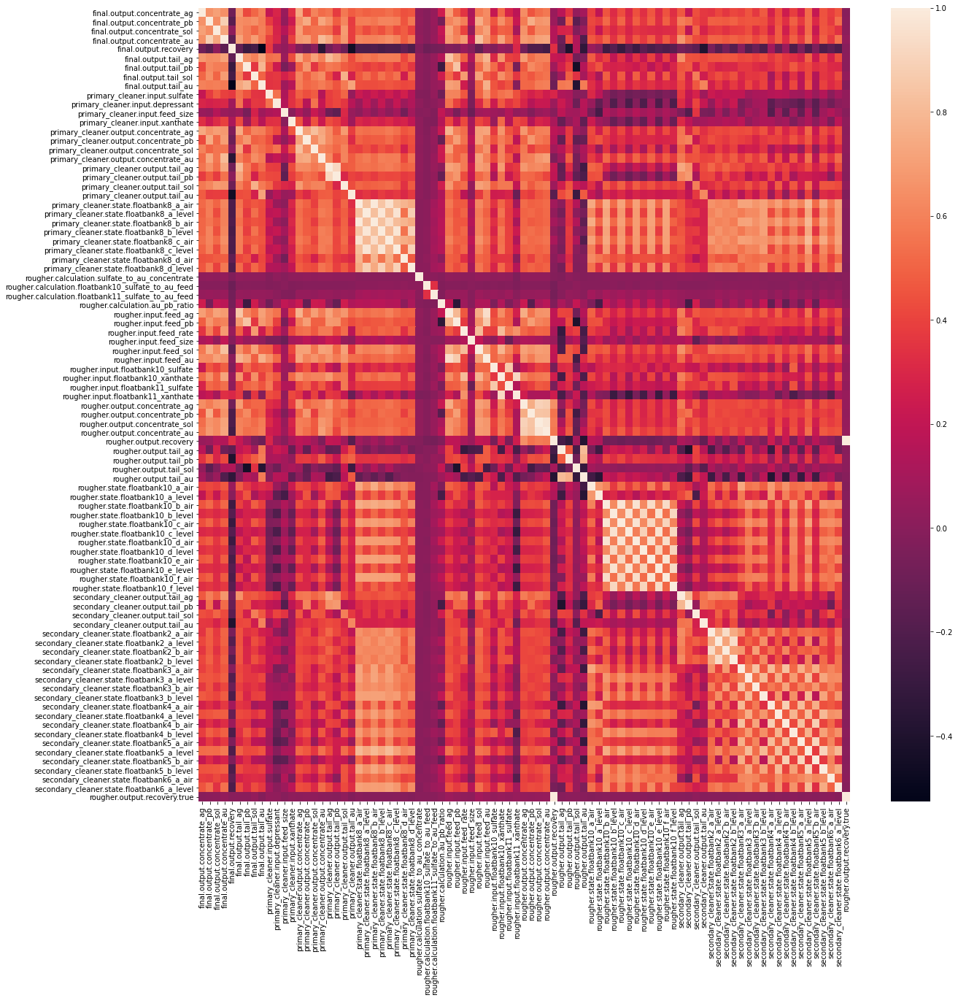

In [25]:
plt.figure(figsize = (20, 20))
sns.heatmap(gold_rec_train.corr())

* Наиболее светлые цвета говорят о высокой корреляции. На тепловой карте выделяются светлые зоны, по ним видно, что такие признаки как primary_cleaner.state.floatbank8_a_air и primary_cleaner.state.floatbank8_b_air (объем воздуха) имеют очень высокую корреляцию. Если посмотреть далее, то такая же высокая корреляция у признаков "уровень жидкости". Мы вполне можем оставить один признак из пары высококоррелирующих. В целом, если рассмотреть емкости и их признаки, То можно оставить показатели для floattanks 2a, 3a, 8a, 10a и 10b.

In [26]:
# также уберем два флотационных реагента, ксантогенат и сульфат 
features_list_drop = []
for name in gold_rec_train.columns:
    if 'air' in name or 'level' in name: 
        if (not '2_a' in name) and (not'3_a' in name) and (not '8_a' in name) and (not '10_a' in name) and (not '10_b' in name):
            features_list_drop.append(name)
features_list_drop.append('rougher.input.floatbank11_sulfate')
features_list_drop.append('rougher.input.floatbank11_xanthate')
gold_rec_train.drop(features_list_drop, axis = 1, inplace = True)
gold_rec_test.drop(features_list_drop, axis = 1, inplace = True)
gold_rec_train.drop(['rougher.output.recovery.true'], axis = 1, inplace = True)

features_list_drop_1 = []
for name in gold_rec_train.columns:
    if ('output' in name and not 'recovery' in name) or 'calculation' in name:
        features_list_drop_1.append(name)

In [27]:
print(gold_rec_train.shape)
print(gold_rec_test.shape)

(16860, 57)
(5856, 23)


**Восполним пропущенные значения**. В описании проекта сказано, что наши данные индексируются датой и временем получения информации. Соседние по времени параметры часто похожи. В таком случае будет резонно заполнить пропущенные значения в зависимости от соседних значений.
* Для этой цели будем использовать **method=ffill**. Это позволит нам заполнить соседними значениями.

In [28]:
'''def fill_missing(df):
    df = df.fillna(method='ffill', inplace=True)
    if df.isna().sum().sum() == 0:
        print('Пропущенных значений не осталось')'''  

"def fill_missing(df):\n    df = df.fillna(method='ffill', inplace=True)\n    if df.isna().sum().sum() == 0:\n        print('Пропущенных значений не осталось')"

In [29]:
gold_rec_train.fillna(method = 'ffill', inplace = True)
print(gold_rec_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 57 columns):
 #   Column                                              Non-Null Count  Dtype         
---  ------                                              --------------  -----         
 0   date                                                16860 non-null  datetime64[ns]
 1   final.output.concentrate_ag                         16860 non-null  float64       
 2   final.output.concentrate_pb                         16860 non-null  float64       
 3   final.output.concentrate_sol                        16860 non-null  float64       
 4   final.output.concentrate_au                         16860 non-null  float64       
 5   final.output.recovery                               16860 non-null  float64       
 6   final.output.tail_ag                                16860 non-null  float64       
 7   final.output.tail_pb                                16860 non-null  float64       
 8   final.

In [30]:
data = gold_rec_full[['date', 'rougher.output.recovery', 'final.output.recovery']]
test = gold_rec_test.merge(data, on = 'date', how = 'left')
test.fillna(method = 'ffill', inplace = True)
print(test.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5856 entries, 0 to 5855
Data columns (total 25 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   date                                        5856 non-null   datetime64[ns]
 1   primary_cleaner.input.sulfate               5856 non-null   float64       
 2   primary_cleaner.input.depressant            5856 non-null   float64       
 3   primary_cleaner.input.feed_size             5856 non-null   float64       
 4   primary_cleaner.input.xanthate              5856 non-null   float64       
 5   primary_cleaner.state.floatbank8_a_air      5856 non-null   float64       
 6   primary_cleaner.state.floatbank8_a_level    5856 non-null   float64       
 7   rougher.input.feed_ag                       5856 non-null   float64       
 8   rougher.input.feed_pb                       5856 non-null   float64       
 9   rougher.

<a id='5'></a>

## 2 Анализ данных

### 2.1 Посмотрим, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах очистки

In [31]:
def hists_and_boxplots(df, col1, col2, col3, col4, hist_name, box_name):
    hist = go.Figure()
    hist.add_trace(go.Histogram(x=df[col1], opacity=0.6, name=col1, histnorm='probability density'))
    hist.add_trace(go.Histogram(x=df[col2], opacity=0.6, name=col2, histnorm='probability density'))
    hist.add_trace(go.Histogram(x=df[col3], opacity=0.6, name=col3, histnorm='probability density'))
    hist.add_trace(go.Histogram(x=df[col4], opacity=0.6, name=col4, histnorm='probability density'))
    hist.update_layout(
    title=hist_name,
    title_x = 0.5,
    xaxis_title="Concentrate",
    yaxis_title="Density",
    legend=dict(x=.1, xanchor="center", orientation="h"),
    barmode='overlay',
    margin=dict(l=0, r=0, t=30, b=0))
    hist.show()
    
    box = go.Figure()
    box.add_trace(go.Box(y=df[col1], name=col1))
    box.add_trace(go.Box(y=df[col2], name=col2))
    box.add_trace(go.Box(y=df[col3], name=col3))
    box.add_trace(go.Box(y=df[col4], name=col4))
    box.update_layout(
    title=box_name,
    title_x = 0.5,
    legend=dict(x=.1, xanchor="center", orientation="h"),
    barmode='overlay',
    margin=dict(l=0, r=0, t=30, b=0))
    box.show()

In [32]:
hists_and_boxplots(gold_rec_train,'rougher.input.feed_au', 'rougher.output.concentrate_au', 
                   'primary_cleaner.output.concentrate_au',
                   'final.output.concentrate_au',
                   'Гистограмма концентраций Au', 'Диаграмма размаха концентрации Au')

### Вывод по Au:
* 1. По гистограммам, которые имеют распределения близкие к нормальному (не считая пиков в районе 0), мы видим, что концентрация золота растет от этапа к этапу. 
* 2. По диаграммам размаха мы видим, что медиана концентрации золота также растет от этапа к этапу. 
* 3. Пики в районе 0 могут свидетельствовать об определенной части технологического процесса. В реальной ситуации я бы запросила информацию по данной части технологического процесса. 

In [33]:
'''hists_and_boxplots(gold_rec_train,'rougher.input.feed_ag', 'rougher.output.concentrate_ag', 
                   'primary_cleaner.output.concentrate_ag',
                   'final.output.concentrate_ag',
                   'Гистограмма концентраций Ag', 'Диаграмма размаха концентрации Ag')'''

"hists_and_boxplots(gold_rec_train,'rougher.input.feed_ag', 'rougher.output.concentrate_ag', \n                   'primary_cleaner.output.concentrate_ag',\n                   'final.output.concentrate_ag',\n                   'Гистограмма концентраций Ag', 'Диаграмма размаха концентрации Ag')"

### Вывод по Ag:
* 1. По гистограммам, которые имеют распределения близкие к нормальному (не считая пиков в районе 0), мы видим, что концентрация серебра снижается к финальной стадии очистки. 
* 2. По диаграммам размаха мы видим, что медиана концентрации серебра также падает. Это вполне согласуется с тем, что задачей стоит увеличение концентрации золота и понижение концентрации других металлов/веществ. 
* 3. Пики в районе 0 могут свидетельствовать об определенной части технологического процесса. В реальной ситуации я бы запросила информацию по данной части технологического процесса. 

In [34]:
'''hists_and_boxplots(gold_rec_train,'rougher.input.feed_pb', 'rougher.output.concentrate_pb', 
                   'primary_cleaner.output.concentrate_pb',
                   'final.output.concentrate_pb',
                   'Гистограмма концентраций Pb', 'Диаграмма размаха концентрации Pb')'''

"hists_and_boxplots(gold_rec_train,'rougher.input.feed_pb', 'rougher.output.concentrate_pb', \n                   'primary_cleaner.output.concentrate_pb',\n                   'final.output.concentrate_pb',\n                   'Гистограмма концентраций Pb', 'Диаграмма размаха концентрации Pb')"

### Вывод по Pb:
* 1. По гистограммам, которые имеют распределения близкие к нормальному (не считая пиков в районе 0), мы видим, что концентрация свинца растет от этапа к этапу. Но при этом прирост после каждого этапа очистки все меньше. Это хорошо видно по диаграммам размаха. 
* 2. Почему так происходит - хороший вопрос, возможно, дело в реагентах, которые направлены на уменьшение концентрации свинца в руде. 
* 3. Пики в районе 0 могут свидетельствовать об определенной части технологического процесса. В реальной ситуации я бы запросила информацию по данной части технологического процесса. 

<a id='6'></a>

### 2.2 Сравним распределения размеров гранул сырья на обучающей и тестовой выборках. 

In [35]:
# Построим гистограммы распределения размеров гранул сырья на обучающей и тестовой выборках.
def hists(df1, df2, col, hist_name, name1, name2):
    hist = go.Figure()
    hist.add_trace(go.Histogram(x=df1[col], name=name1, opacity=0.6))
    hist.add_trace(go.Histogram(x=df2[col], name=name2, opacity=0.6))
   
    hist.update_layout(
    title=hist_name,
    title_x = 0.5,
    xaxis_title="Feed Size",
    legend=dict(x=.1, xanchor="center", orientation="h"),
    barmode='overlay',
    margin=dict(l=0, r=0, t=30, b=0))
    hist.show()

In [36]:
hists(gold_rec_train, gold_rec_test, 'rougher.input.feed_size', 'Распределения размеров гранул', 'обучающая выборка', 'тестовая выборка')

### Вывод
Судя по двум гистограммам наши распределения несильно отличаются друг от друга. Оценка модели впоследствие должны быть правильной. 

<a id='7'></a>

## 2.3 Подсчитаем суммарную концентрацию всех веществ на разных стадиях

In [37]:
# Суммарная концентрация всех веществ в исходном сырье
gold_rec_train['rougher_feed.consm'] = gold_rec_train['rougher.input.feed_au'] + \
                                                            gold_rec_train['rougher.input.feed_ag'] + \
                                                            gold_rec_train['rougher.input.feed_pb'] +\
                                                           gold_rec_train['rougher.input.feed_sol']

# Суммарная концентрация всех веществ после флотации (черновой концентрат)
gold_rec_train['rougher_output.consm'] = gold_rec_train['rougher.output.concentrate_au'] + \
                                                            gold_rec_train['rougher.output.concentrate_ag'] + \
                                                            gold_rec_train['rougher.output.concentrate_pb'] +\
                                                           gold_rec_train['rougher.output.concentrate_sol']
# Суммарная концентрация всех веществ после первого этапа очистки
gold_rec_train['primary_cleaner.consm'] = gold_rec_train['primary_cleaner.output.concentrate_au'] + \
                                                            gold_rec_train['primary_cleaner.output.concentrate_ag'] + \
                                                            gold_rec_train['primary_cleaner.output.concentrate_pb'] +\
                                                           gold_rec_train['primary_cleaner.output.concentrate_sol']

# Суммарная концентрация всех веществ в финальном концентрате 
gold_rec_train['final.consm'] = gold_rec_train['final.output.concentrate_au'] + \
                                                            gold_rec_train['final.output.concentrate_ag'] + \
                                                            gold_rec_train['final.output.concentrate_pb'] +\
                                                           gold_rec_train['final.output.concentrate_sol']

In [38]:
# Построим гисторамму всех этапов, Каждый этап можно рассмотреть отдельно переключаясь в Plotly
fig = go.Figure()
fig.add_trace(go.Histogram(x=gold_rec_train['rougher_feed.consm'] , opacity=0.7, name='Сырье', histnorm='probability density'))
fig.add_trace(go.Histogram(x=gold_rec_train['rougher_output.consm'], opacity=0.7, name='Черновой концентрат', histnorm='probability density'))
fig.add_trace(go.Histogram(x=gold_rec_train['primary_cleaner.consm'], opacity=0.7, name='После первого этапа', histnorm='probability density'))
fig.add_trace(go.Histogram(x=gold_rec_train['final.consm'], opacity=0.7, name='Финальный этап', histnorm='probability density'))
fig.update_layout(
title="Концентрация всех веществ на разных этапах",
title_x = 0.5,
xaxis_title="Концентрация",
yaxis_title="Плотность",
legend=dict(x=.1, xanchor="center", orientation="h"),
barmode='overlay',
margin=dict(l=0, r=0, t=30, b=0))
fig.show()

### Вывод
**По гистограммам мы видим аномальные значения в районе 0 на всех этапах. Вероятно, это что-то наподобие "артефактов", либо какие-то сбои в работе оборудования, либо же нюансы технологического процесса. У нас нет возможности запросить дополнительную информацию, поэтому избавимся от данных значений.**

* Оставим значения, которые больше 1.

In [39]:
gold_rec_train = gold_rec_train[gold_rec_train['rougher_feed.consm'] > 1]
gold_rec_train = gold_rec_train[gold_rec_train['rougher_output.consm'] > 1]
gold_rec_train = gold_rec_train[gold_rec_train['primary_cleaner.consm'] > 1]
gold_rec_train = gold_rec_train[gold_rec_train['final.consm'] > 1]

In [40]:
features_list_drop_2 = []
for name in gold_rec_train.columns:
    if 'date' in name or 'consm' in name:
        features_list_drop_1.append(name)
gold_rec_train.drop(features_list_drop_1, axis = 1, inplace = True)
gold_rec_train.drop(features_list_drop_2, axis = 1, inplace = True)
test.drop(['date'], axis = 1, inplace = True)

<a id='8'></a>

## 3. Построим модель

### 3.1 Напишем функцию для вычисления итоговой sMAPE

Одна функция будет рассчитывать метрику качества **sMAPE (Symmetric Mean Absolute Percentage Error** по формуле:
<img src="https://pictures.s3.yandex.net/resources/smape_1576238825.jpg" width="800">


Другая функция нам необходима, чтобы рассчитать итоговую метрику:

<img src="https://pictures.s3.yandex.net/resources/_smape_1576238814.jpg" width="800">


In [41]:
def smape(pred, true):
    sum_of = 0
    for i in range(len(true)):
        sum_of += abs(true[i] - pred[i]) / (abs(true[i]) + abs(pred[i]))
    sum_of = sum_of * 100 / (len(true) / 2)
    return sum_of

def double_smape(pred, true):
    return 0.25 * smape(pred[:,0], true[:,0]) + 0.75 * smape(pred[:,1], true[:,1])

<a id='9'></a>

### 3.2 Обучение моделей
### 3.2.2 Выделим целевые признаки. Проведем стандартизацию данных 

In [42]:
features_train = gold_rec_train.drop(['rougher.output.recovery', 'final.output.recovery'], axis = 1)
features_test = test.drop(['rougher.output.recovery', 'final.output.recovery'], axis = 1)

target_train = gold_rec_train[['rougher.output.recovery', 'final.output.recovery']]
target_test = test[['rougher.output.recovery', 'final.output.recovery']]

target_train_np = target_train.copy().to_numpy()
target_test_np = target_test.copy().to_numpy()

In [43]:
#Масштабируем наши признаки
scaler = StandardScaler()
scaler.fit(features_train)
features_train = scaler.transform(features_train)
features_test = scaler.transform(features_test)

<a id='10'></a>

### 3.2.3 Обучим разные модели


**Алгоритм решающего дерева**

In [44]:
tree_best_depth = 20
tree_best_score = 100
for i in range (20, 100, 10):
    tree = DecisionTreeRegressor(max_depth = i, 
                                 random_state = 12345)
    cvs = cross_val_score(tree, features_train, target_train_np, cv = 5, scoring = make_scorer(double_smape, greater_is_better=True))
    final_score = sum(cvs) / len(cvs)
    if final_score < tree_best_score:
        tree_best_score = final_score
        tree_best_depth = i
        
tree_best_samples_leaf = 3
for i in range (3, 10):
    tree = DecisionTreeRegressor(max_depth = tree_best_depth, 
                                 min_samples_leaf = i, 
                                 random_state = 12345)
    cvs = cross_val_score(tree, features_train, target_train_np, cv = 5, scoring = make_scorer(double_smape, greater_is_better=True))
    final_score = sum(cvs) / len(cvs)
    if final_score < tree_best_score:
        tree_best_score = final_score
        tree_best_samples_leaf = i

print('Оптимальная глубина решающего дерева:', tree_best_depth)
print('Минимальное оптимальное количество объектов в листе:', tree_best_samples_leaf)
print('Значение метрики sMAPE: {:.2f}'.format(tree_best_score))

Оптимальная глубина решающего дерева: 40
Минимальное оптимальное количество объектов в листе: 8
Значение метрики sMAPE: 11.86


**Алгоритм случайного леса**

In [45]:
%%time
forest_best_est = 20
forest_best_score = 100
for i in range (20, 100, 10):
    forest = RandomForestRegressor(n_estimators = i, 
                                 n_jobs = -1, 
                                 random_state = 12345)
    cvs = cross_val_score(forest, features_train, target_train_np, cv = 5, scoring = make_scorer(double_smape, greater_is_better=True))
    final_score = sum(cvs) / len(cvs)
    if final_score < forest_best_score:
        forest_best_score = final_score
        forest_best_est = i

forest_best_depth = 3
for i in range (3, 10):
    forest = RandomForestRegressor(n_estimators = forest_best_est, 
                                 max_depth = i, 
                                 n_jobs = -1, 
                                 random_state = 12345)
    cvs = cross_val_score(forest, features_train, target_train_np, cv = 5, scoring = make_scorer(double_smape, greater_is_better=True))
    final_score = sum(cvs) / len(cvs)
    if final_score < forest_best_score:
        forest_best_score = final_score
        forest_best_depth = i

print('Оптимальное количество решающих деревьев:',forest_best_est)
print('Наилучшая максимальная глубина деревьев:',forest_best_depth)
print('Значение метрики sMAPE: {:.2f}'.format(forest_best_score))

Оптимальное количество решающих деревьев: 90
Наилучшая максимальная глубина деревьев: 4
Значение метрики sMAPE: 9.00
Wall time: 5min 40s


**Алгоритм k-ближайших соседей**

In [46]:
%%time
knn_best_score = 50
knn_n = 1
for i in range (50, 950, 50):
    knn = KNeighborsRegressor(n_neighbors = i, n_jobs = -1)
    cvs = cross_val_score(knn, features_train, target_train_np, cv = 5, scoring = make_scorer(double_smape, greater_is_better=True))
    final_score = sum(cvs) / len(cvs)
    if final_score < knn_best_score:
        knn_best_score = final_score
        knn_n = i

knn_best_n = knn_n
for i in range (knn_n - 25, knn_n + 26, 10):
    knn = KNeighborsRegressor(n_neighbors = i, n_jobs = -1)
    cvs = cross_val_score(knn, features_train, target_train_np, cv = 5, scoring = make_scorer(double_smape, greater_is_better=True))
    final_score = sum(cvs) / len(cvs)
    if final_score < knn_best_score:
        knn_best_score = final_score
        knn_best_n = i
        
print('Наилучшее количество соседей:',knn_best_n)
print('Значение метрики sMAPE = {:.2f}'.format(knn_best_score))

Наилучшее количество соседей: 815
Значение метрики sMAPE = 8.77
Wall time: 2min 31s


<a id='11'></a>

### 3.2.4 Проверка на тестовой выборке

In [48]:
print('Значение итоговой метрики sMAPE:')
dummy = DummyRegressor()
dummy.fit(features_train, target_train)
dummy_score = double_smape(dummy.predict(features_test), target_test_np)
print('Dummy модель: {:.2f}'.format(dummy_score))

      
tree_mod = DecisionTreeRegressor(max_depth = 30, min_samples_leaf=8, random_state=12345)
tree_mod.fit(features_train, target_train)
tree_test_score = double_smape(tree_mod.predict(features_test), target_test_np)
print('Модель решающего дерева: {:.2f}'.format(tree_test_score))


forest = RandomForestRegressor(n_estimators = 90, 
                                 max_depth = 4,  
                                 n_jobs = -1,
                                 random_state = 12345)
forest.fit(features_train, target_train)
forest_test_score = double_smape(forest.predict(features_test), target_test_np)
print('Модель случайного леса: {:.2f}'.format(forest_test_score))


knn = KNeighborsRegressor(n_neighbors = 815, n_jobs = -1)
knn.fit(features_train, target_train)
knn_test_score = double_smape(knn.predict(features_test), target_test_np)
print('Модель к-ближайших соседей: {:.2f}'.format(knn_test_score))


Значение итоговой метрики sMAPE:
Dummy модель: 12.34
Модель решающего дерева: 13.73
Модель случайного леса: 12.11
Модель к-ближайших соседей: 10.64


* Сделаем сводную таблицу по моделям

In [49]:
data = {'Алгоритм':['Dummy модель','Решающее дерево', 'Случайный лес','алгоритм k-ближайших соседей'],
        'Значение итоговой метрики sMAPE':[dummy_score,tree_test_score, forest_test_score, knn_test_score]}
     
models = pd.DataFrame(data=data)
models = models.set_index('Алгоритм')
display(models)

,Значение итоговой метрики sMAPE
Алгоритм,
Dummy модель,12.335778
Решающее дерево,13.730101
Случайный лес,12.109716
алгоритм k-ближайших соседей,10.643237


<a id='12'></a>

## Вывод
* Я брала три модели: модель алгоритма решающего дерева, случайного леcа и k-ближайших соседей. 
* Наилучший результат показала модель алгоритма k-ближайших соседей. Значение итоговой метрики **sMAPE - 10.64, что лучше, чем константная модель (в нашем случае DummyRegressor со sMAPE 12.34).**